## Домашняя работа № 1.

Домашнее задание сдаётся в виде ссылки (с доступом комментатор или редактор) на Colab в опросе:
	https://forms.gle/LJEMdpXAGUvTu8vP8

## Image pre-processing.

В этой домашней работе мы попробуем поприменять самые простые способы обработки изображений.

* Soft deadline: **27.01.2022 03:00:00 +0003 GMT** 
* Hard deadline: **03.02.2022 03:00:00 +0003 GMT**


In [1]:
import cv2
import matplotlib.pylab as plt
from numpy.random import permutation
from google.colab.patches import cv2_imshow
% matplotlib inline
import numpy as np
from plotly.subplots import make_subplots
import plotly.graph_objects as go

##### Задача 1 (3 балла)

Загрузите изображение *lena.png* в переменную **lena**. Отобразите результат на экран. Убедитесь, что `opencv` открывает изображение в формате BGR, переведите его в RGB несколькими способами: 
* c помощью функций split & merge
* с помощью индексации в numpy 
* с помощью cvtColor

In [ ]:
lena = cv2.imread('/lena.png')

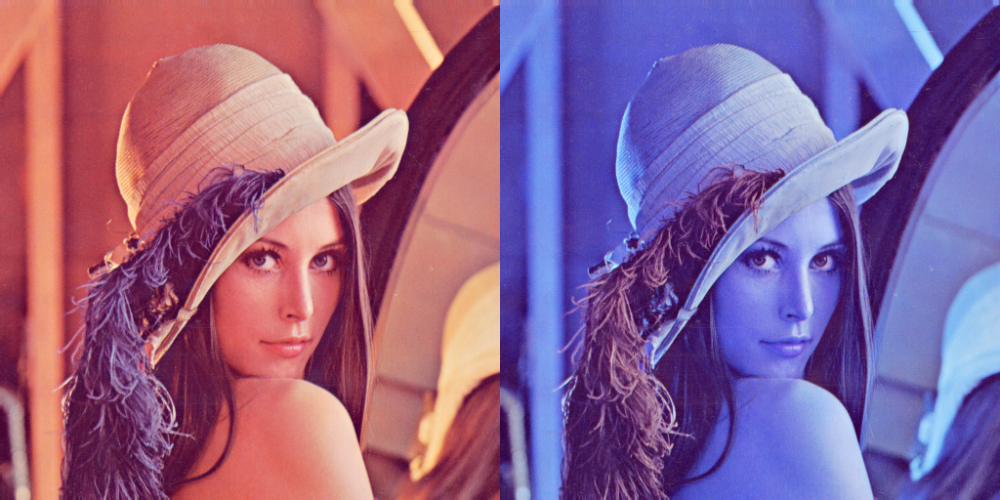

In [ ]:
b, g, r = cv2.split(lena)
new_lena = cv2.merge((r, g, b))

b, g, r = np.dsplit(lena, 3)
new_lena2 = np.dstack([r, g, b])

new_lena3 = cv2.cvtColor(lena, code=cv2.COLOR_BGR2RGB)
cv2_imshow(np.hstack([lena, new_lena]))

Работа над ошибками - Задание 1.
1. Numpy
2. Визуализация Лены

In [ ]:
#  В качестве пункта с numpy, я хотела использовать функции np.dsplit, np.dstack, 
#  однако, это действительно не индексация, так что альтернативный способ сделать это:
new_lena_np = lena[:,:,::-1]

In [ ]:
"""
Новая Лена получилась правильной, но cv_imshow принимает на вход BGR, в результате чего,
новая Лена (в формате RGB) отображается некорректно. 
Воспульзуемся plotly, чтобы продемонстрировать, что новые Лены правильно переведены в формат RGB.
""" 
fig = make_subplots(rows=1, cols=3,
                    subplot_titles=("c помощью функций split & merge",
                                    "с помощью индексации в numpy", "с помощью cvtColor"))

# Add traces
fig.add_trace(go.Image(z=new_lena), row=1, col=1)
fig.add_trace(go.Image(z=new_lena_np), row=1, col=2)
fig.add_trace(go.Image(z=new_lena3), row=1, col=3)

# # Update xaxis properties
fig.update_xaxes(showticklabels=False, row=1, col=1)
fig.update_xaxes(showticklabels=False, row=1, col=2)
fig.update_xaxes(showticklabels=False, row=1, col=3)

# # Update yaxis properties
fig.update_yaxes(showticklabels=False, row=1, col=1)
fig.update_yaxes(showticklabels=False, row=1, col=2)
fig.update_yaxes(showticklabels=False, row=1, col=3)

# # Update title and height
fig.update_layout(title_text="Three way to convert BGR to RGB visualization result")
fig.update_layout(showlegend=False)

fig.show()


Output hidden; open in https://colab.research.google.com to view.

##### Задача 2 (3 балла)

Поменяйте местами левую верхнюю и правую нижнюю четвертинки изображения **lena** и отобразите результат на экран.

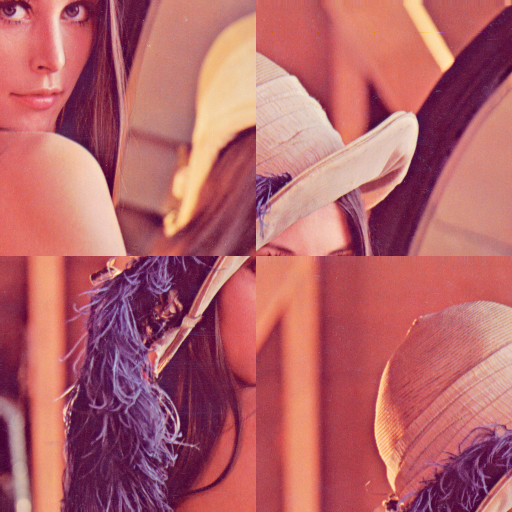

In [ ]:
middle = lena.shape[0] // 2
flipped_lena = lena.copy()
flipped_lena[:middle, :middle, :], flipped_lena[middle:, middle:, :] =\
     lena[middle:, middle:, :], lena[:middle,:middle, :]

cv2_imshow(flipped_lena)

##### Задача 3 (3 балла)

Усредните значения всех трех цветовых каналов **lena** в каждый из каналов итогового изображения **lena_gray_my**. Переведите исходное цветное изображение lena в изображение в градациях серого с помощью функции cvtColor. (lena_gray_cvt). Вычислите модуль разности между изображениями **lena_gray_my** и **lena_gray_cvt** и отобразите ее на экране. 

The difference between mean method and cv2: 1483954 



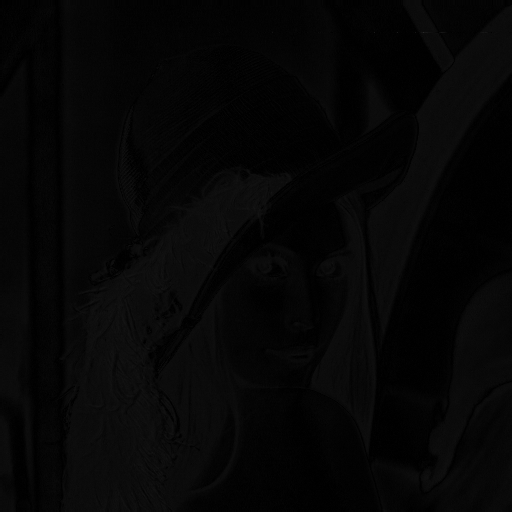

In [ ]:
lena_gray_my = np.mean(new_lena, axis=-1).astype(np.int32)
lena_gray_cvt = cv2.cvtColor(new_lena, cv2.COLOR_RGB2GRAY).astype(np.int32)
diff = abs(lena_gray_my - lena_gray_cvt)
print(f"The difference between mean method and cv2: {round(diff.sum())} \n")
cv2_imshow(diff)

##### Задача 4 (3 балла)
Переведите изображение **lena** в одно из цветовых пространств (cvtColor) с выделенной координатой яркости (HSV, HSL, HSB, CIE Lab), инвертируйте яркостную составляющую, переведите обратно в RGB. Отобразите результат.

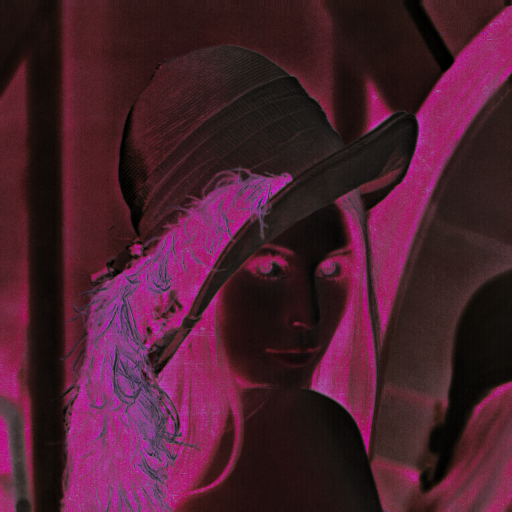

In [ ]:
lena_hsv = cv2.cvtColor(lena, cv2.COLOR_BGR2HSV)
lena_hsv[:, :, 2] = 255 - lena_hsv[:, :, 2]
lena_back = cv2.cvtColor(lena_hsv, code=cv2.COLOR_HSV2BGR)
cv2_imshow(lena_back)

##### Задача 5 (3 балла)

По цветному изображению **lena** на входе сгенерируйте 6 цветных изображений, полученных путем перестановки значений цветовых каналов r, g и b. исходного изображения. Соберите коллаж $3x2$ и отобразите его на экране. 

In [ ]:
from itertools import permutations

lenocki = [cv2.merge((b, g, r)) for b, g, r in permutations(cv2.split(lena))]

row1, row2 = np.hstack(lenocki[:3]), np.hstack(lenocki[3:])
collage = np.vstack([row1 ,row2])
cv2_imshow(collage)

Output hidden; open in https://colab.research.google.com to view.

####Задача 6 (3 балла)
Переведите изображение **lena** в градации серого. Примените к серому изображению операцию линейного растяжения диапазона яркостей ( 𝑛𝑜𝑟𝑚𝑎𝑙𝑖𝑧𝑒 ) и эквализации гистограммы ( 𝑒𝑞𝑢𝑎𝑙𝑖𝑧𝑒𝐻𝑖𝑠𝑡 ). Постройте разность полученных результатов. Состыкуйте в одно изображение в градациях серого результат линейного растяжения, эквализации и их разности

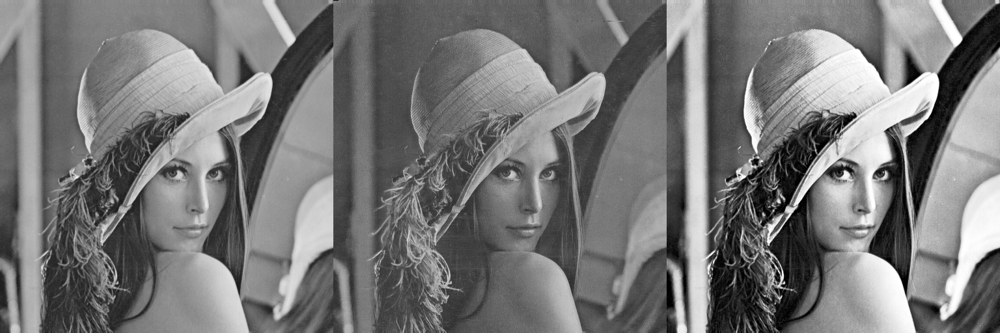

In [ ]:
lena_gray_cvt = cv2.cvtColor(new_lena, cv2.COLOR_RGB2GRAY)


# 𝑛𝑜𝑟𝑚𝑎𝑙𝑖𝑧𝑒 
norm_lena = np.empty_like(lena_gray_cvt)
cv2.normalize(lena_gray_cvt, dst=np.empty_like(lena_gray_cvt), alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

# 𝑒𝑞𝑢𝑎𝑙𝑖𝑧𝑒𝐻𝑖𝑠𝑡
equalize_lena = cv2.equalizeHist(lena_gray_cvt)

lenki = np.hstack([lena_gray_cvt, norm_lena, equalize_lena])
cv2_imshow(lenki)

####Задача 7 (3 балла)
Реализуйте функцию добавления шума «соль и перец» для одноканального изображения. Входные параметры: $src$ – исходная одноканальная матрица $Mat$, $p$ – вероятность замещения исходных значений на $0$, $q$ – вероятность замещения исходных значений на $255$. Загрузите изображение $lena.jpg$, выделите каналы изображения в отдельные матрицы ($split$), добавьте шум «соль и перец» в каждый канал при помощи реализованной Вами функции с параметрами

1. $p=q=0.05$
2. $p=q=0.1$
3. $p=q=0.15$

In [ ]:
def adding_noise_1c(image: np.ndarray, p: int, q: int) -> np.ndarray:
    """
    Adding noise to an channel of image.

    Parameters
    ----------
    image: ndarray
        Input image of shape (w, h)
    p: float
        Integer number [0, 1] - probability to add salt
    q: float
        Real number [0, 1] - probability to add paper

    Returns
    -------
        Channel with noise added.
    """
    probs = np.random.uniform(size=image.shape)
    paper = np.where(probs <= p + q, 255, image)
    salt = np.where(probs < p, 0, paper)
    return salt

In [ ]:
def add_noise(image: np.ndarray, p: int, q: int) -> np.ndarray:
    """
    Adding noise to an image in BGR

    Parameters
    ----------
    image: ndarray
        Input image of shape (w, h, c)
    p: float
        Integer number [0, 1] - probability to add salt
    q: float
        Real number [0, 1] - probability to add paper

    Returns
    -------
        Image with noise added.
    """
    r, g, b = np.dsplit(image, 3)
    return np.dstack([adding_noise_1c(channel, p, q) for channel in [b, g, r]])
    
pq = [0.05, 0.1, 0.15]
noise_len = np.hstack([add_noise(new_lena, p, p) for p in pq])
cv2_imshow(noise_len)

Output hidden; open in https://colab.research.google.com to view.

####Задча 8 (3 балла)
Реализуйте функцию пространственной фильтрации изображения однородным усредняющим фильтром размера $n \times n$ (все коэффициенты маски равны $\frac{1}{n^2}$). При вычислении среднего используйте тот факт, что при переходе от точки к точке обновляется только часть элементов изображения под маской. Примените реализованный фильтр к предварительно переведенному в градации серого изображению $lena.jpg$ при $n = 3$ и $n = 5$. Визуализируйте изображение, представляющее собой разность полученных результатов фильтрации.

In [ ]:
def average_pooling(image: np.ndarray, f: int, mode: str=None) -> np.ndarray:
    """
    O(n^2) implementation of average pooling.

    Parameters
    ----------
    image : ndarray
        Input image.
    f : int 
        Non negative integer number. Filter size.
    mode : string, optional
        If mode is 'same' output image has the same shape
        as input.

    Returns
    -------
    out : ndarray
        Convolved image.
    """
    if mode == 'same':
        pad = (f - 1) // 2
        image = np.pad(image, pad_width=pad, mode='constant')
    q = np.cumsum(np.cumsum(image, axis=1), axis=0)
    v_n, h_n = q.shape
    v_final, h_final = v_n - f + 1, h_n - f + 1
    final_res = np.zeros((v_final, h_final))
    subst = 0

    for j in range(h_final):
        for i in range(v_final):
            if i - 1 >= 0 and j - 1 >= 0:
                subst = q[i + f - 1][j - 1] + q[i - 1][j + f - 1] - q[i - 1][j - 1]
            else:
                if i - 1 >= 0:
                    subst = q[i - 1][j + f - 1]
                if j - 1 >= 0:
                    subst = q[i + f - 1][j - 1]

            result = q[i + f - 1][j + f - 1] - subst
            final_res[i][j] = result / f ** 2

    return final_res

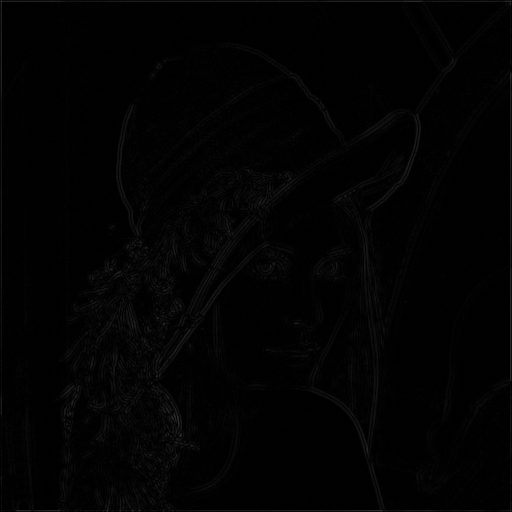

In [ ]:
conv_f3 = average_pooling(lena_gray_cvt, f=3, mode='same')
conv_f5 = average_pooling(lena_gray_cvt, f=5, mode='same')

diff_conv = abs(conv_f5.astype(np.int32) - conv_f3.astype(np.int32))
cv2_imshow(diff_conv)

####Задача 10 (6 баллов) 
С помощью [виджетов](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html) создайте 2 слайдера с настройками параметров гамма-коррекции. Отобразите **lena**, ее гамма-преобразование и график в диапозоне от [0;1], так, чтобы параметры слайдера соответствовали параметрам гамма-коррекции.

In [ ]:
def adjust_gamma(image, gamma, gain):
    """
    LUT based implementation of gamma adjustment.
    Parameters
    ----------
    image : ndarray
        Input image.
    gamma : float, optional
        Non negative real number. Default value is 1.
    gain : float, optional
        The constant multiplier. Default value is 1.

    Returns
    -------
    out : ndarray
        Gamma corrected output image.
    """
    lut = (255 * gain * (np.linspace(0, 1, 256) ** gamma)).astype('uint8')
    return lut[image] # gain * image ** gamma


In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from ipywidgets import interact


@interact(A=(0, 1, 0.01), gamma=(0.1, 2, 0.01))
def gamma_correction_play(A=1, gamma=1):
    # Initialize figure with subplots
    fig = make_subplots(rows=1, cols=3,
                        subplot_titles=(r'$\gamma = {name} \quad A = {gain}$'.format(name=gamma, gain=A),
                                        "Original Lena", "Corrected Lena"))

    x = np.linspace(0, 1, 100)
    gamma_corrected = adjust_gamma(new_lena, gamma=gamma, gain=A)

    # Add traces
    fig.add_trace(go.Scatter(x=x, y=A * np.power(x, 1 / gamma)), row=1, col=1)
    fig.add_trace(go.Scatter(x=x, y=x), row=1, col=1)
    fig.add_trace(go.Image(z=new_lena), row=1, col=2)
    fig.add_trace(go.Image(z=gamma_corrected), row=1, col=3)

    # # Update xaxis properties
    fig.update_xaxes(title_text=r'$V_{in}$', range=[0, 1], row=1, col=1)
    fig.update_xaxes(showticklabels=False, row=1, col=2)
    fig.update_xaxes(showticklabels=False, row=1, col=3)

    # # Update yaxis properties
    fig.update_yaxes(title_text=r'$AV_{in}^\gamma$', range=[0, 1], row=1, col=1)
    fig.update_yaxes(showticklabels=False, row=1, col=2)
    fig.update_yaxes(showticklabels=False, row=1, col=3)

    # # Update title and height
    fig.update_layout(title_text="Gamma correction", height=512, width=1315)
    fig.update_layout(showlegend=False)

    fig.show()

interactive(children=(FloatSlider(value=1.0, description='A', max=1.0, step=0.01), FloatSlider(value=1.0, desc…